In [1]:
import scanpy as sc
import pygot 
import torch
import numpy as np
import pandas as pd
from torchdiffeq import odeint
from tqdm import tqdm
import matplotlib.pyplot as plt
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
plt.rc('axes.spines', top=False, right=False)
%matplotlib inline

In [2]:
from sklearn.preprocessing import minmax_scale
def traj_loss(traj, X, cell_time, reverse=False):
    ts = np.sort(np.unique(cell_time) )
    intervals = minmax_scale(ts)
    t_idx = [np.where(cell_time == t)[0] for t in ts]
    
    traj = torch.Tensor(traj).to(device)
    if reverse:
        traj = torch.flip(traj, dims=[0])
    loss = []
    for i in range(len(traj)):
        for j, t in enumerate(intervals):
            if (i + 0.1) / len(traj) <= intervals[j]:
                selected = j - 1
                break
        idx = np.concatenate([t_idx[selected], t_idx[selected+1]])
        loss.append(torch.cdist(traj[i], X[idx]).min(dim=1).values.mean().item())
    return np.mean(loss)


## Veres 2019

In [4]:
adata = sc.read_h5ad('../pygot_data/IVB.h5ad')

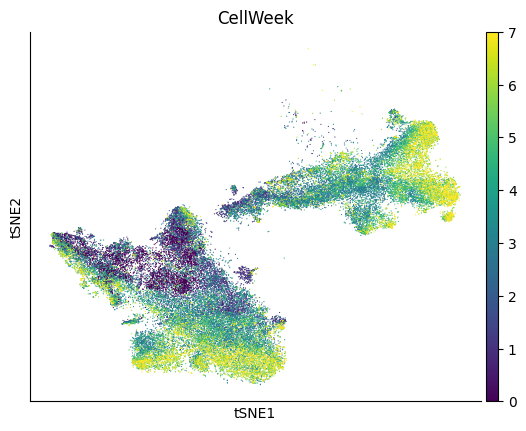

In [6]:
from scbeta_preprocess import CountsNormalizer, PCAProjection

data_dir = './data/beta_diff/'
normalizer = torch.load(data_dir+'/normalizer.pt')
pcaer = torch.load(data_dir+'/pcaer.pt')
time_key = 'CellWeek'
cell_type_key = 'Assigned_cluster'
embedding_key = 'X_pca'
adata.obs[time_key] = adata.obs[time_key].astype(int)
cell_time = adata.obs[time_key].to_numpy()
sc.pl.tsne(adata, color=time_key)

### traj loss

In [51]:
for i in range(20):
    model, _ = pygot.tl.traj.fit_velocity_model(adata, time_key=time_key, embedding_key=embedding_key, device=device, path='./benchmark_model/GOT/01.2_trajectories/veres19/')

    mioflow, _ = pygot.external.MIOFlow_interface(adata, time_key=time_key, gae_embedded_dim=30,  use_density_loss=True, batch_size=256, embedding_key=embedding_key, use_emb=False, use_gae=False, exp_dir='/mnt/d/tmp')

    otcfm_model, history = pygot.external.OTCFM_interface(adata, iter_n=10000,time_key=time_key, embedding_key=embedding_key, device=device)
    
    torch.save(model, './benchmark_model/GOT/01.2_trajectories/veres19/veres19_{}.pkl'.format(i))
    torch.save(mioflow, './benchmark_model/MIOFlow/01.2_trajectories/veres19/veres19_{}.pkl'.format(i))
    torch.save(otcfm_model, './benchmark_model/CFM/01.2_trajectories/veres19/veres19_{}.pkl'.format(i))

loss :3.0382 best :3.0326: 100%|██████████| 10000/10000 [06:43<00:00, 24.77it/s]


In [7]:
X_start = torch.Tensor(adata[adata.obs[time_key] == 0].obsm[embedding_key])
X = torch.Tensor(adata.obsm[embedding_key])
X = X.to('cuda')
got_loss, new_got_loss, mioflow_loss, otcfm_loss = [], [], [], []
for i in tqdm(range(0, 20)):
    
    model = torch.load('./benchmark_model/GOT/01.2_trajectories/veres19/veres19_{}.pkl'.format(i))
    traj = odeint(model, X_start, torch.Tensor(np.linspace(0, 7, 100)), method='rk4').detach().cpu().numpy()
    got_loss.append(traj_loss(traj, X, cell_time))
    
    mioflow = torch.load('./benchmark_model/MIOFlow/01.2_trajectories/veres19/veres19_{}.pkl'.format(i))
    try:
        traj = odeint(mioflow.func, X_start, torch.Tensor(np.linspace(0, 7, 100)), method='rk4').detach().cpu().numpy()
        mioflow_loss.append(traj_loss(traj, X, cell_time))
    except:
        print('Fail MIOFLOW')

    otcfm = torch.load('./benchmark_model/CFM/01.2_trajectories/veres19/veres19_{}.pkl'.format(i))
    traj = odeint(otcfm, X_start, torch.Tensor(np.linspace(0, 7, 100)), method='rk4').detach().cpu().numpy()
    otcfm_loss.append(traj_loss(traj, X, cell_time))

100%|█████████████████████████████████████████████████████████████████████████████████| 20/20 [00:44<00:00,  2.21s/it]


In [8]:

got_res = pd.DataFrame(got_loss, columns=['Loss'])
got_res['method'] = 'GOT'
mioflow_res = pd.DataFrame(mioflow_loss, columns=['Loss'])
mioflow_res['method'] = 'MIOFlow'
otcfm_res = pd.DataFrame(otcfm_loss, columns=['Loss'])
otcfm_res['method'] = 'OT-CFM'


<Axes: xlabel='method', ylabel='Loss'>

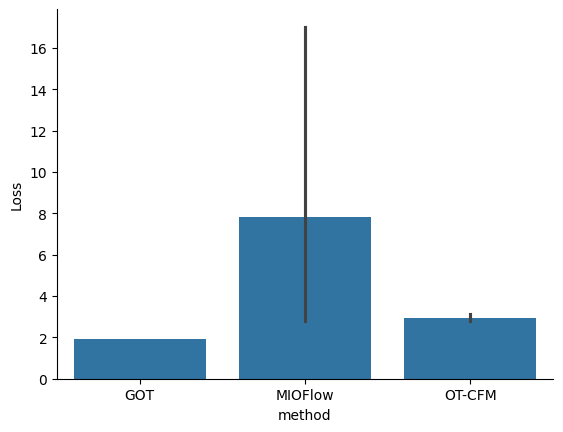

In [9]:
import seaborn as sns
plot_df = pd.concat([got_res, mioflow_res, otcfm_res])
sns.barplot(plot_df, x='method', y='Loss')
#plot_df.to_csv('./results/01.2_trajectories/veres19_traj_real.txt', sep='\t')

In [25]:

model = torch.load('./benchmark_model/GOT/01.2_trajectories/veres19/veres19_9.pkl')
otcfm = torch.load('./benchmark_model/CFM/01.2_trajectories/veres19/veres19_18.pkl')
mioflow = torch.load('./benchmark_model/MIOFlow/01.2_trajectories/veres19/veres19_2.pkl')

In [26]:
adata.obsm['X_ptsne'], map_model = pygot.pp.learn_embed2vis_map(adata, embedding_key, vis_key='X_tsne')

Epoch [35/100], Train Loss: 21.7191, Val Loss: 23.4428:  34%|███████████▌                      | 34/100 [00:18<00:36,  1.82it/s]

Early stopping triggered
Test Loss: 21.7470


In [27]:
idx = adata[adata.obs[time_key] == 0].obs.sample(n=100).index

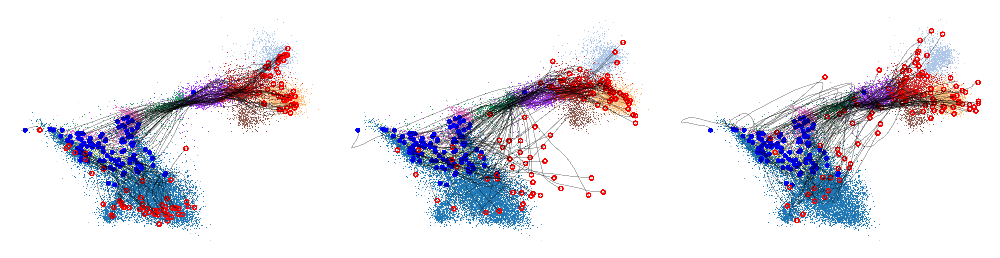

In [29]:
fig, axes = plt.subplots(1,3, figsize=(6.4*3, 4.8), dpi=450)
traj = pygot.tl.traj.simulate_trajectory(adata[idx], model, embedding_key, start=0, end=7)
lowd_traj = map_model.transform(traj)
pygot.pl.plot_trajectory(adata, lowd_traj,  basis='ptsne', ax = axes[0], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})

traj = pygot.tl.traj.simulate_trajectory(adata[idx], otcfm, embedding_key, start=0, end=7)
lowd_traj = map_model.transform(traj)
pygot.pl.plot_trajectory(adata, lowd_traj,  basis='ptsne', ax = axes[1], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})


traj = pygot.tl.traj.simulate_trajectory(adata[idx], mioflow.func, embedding_key, start=0, end=7)
lowd_traj = map_model.transform(traj)
pygot.pl.plot_trajectory(adata, lowd_traj,  basis='ptsne', ax = axes[2], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})

fig.subplots_adjust(wspace=0.01, hspace=0.2)
plt.savefig('/disk/share/xuruihong/pygot_fig/veres_traj.jpg', format='jpg')
plt.show()

## Gastrulation

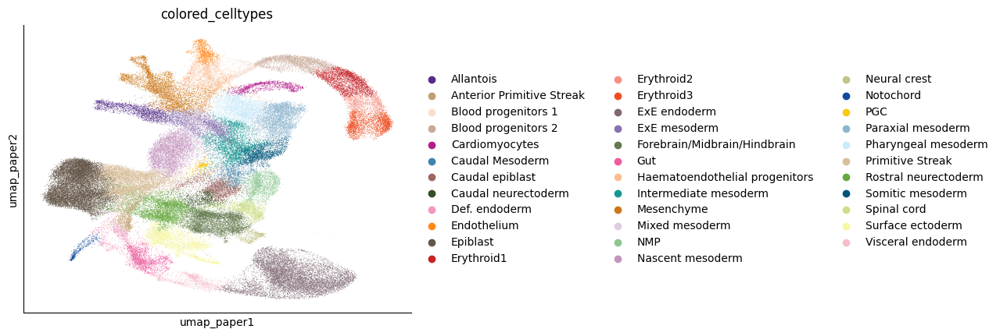

In [10]:
adata = sc.read('../pygot_data/GTL.h5ad')
sc.pl.embedding(adata, basis="umap_paper", color="colored_celltypes")
adata.obs['stage_numeric'] = adata.obs['stage'].apply(lambda x: float(x[1:]))
adata.obs['stage_numeric'] = adata.obs['stage_numeric'].astype(np.float32)

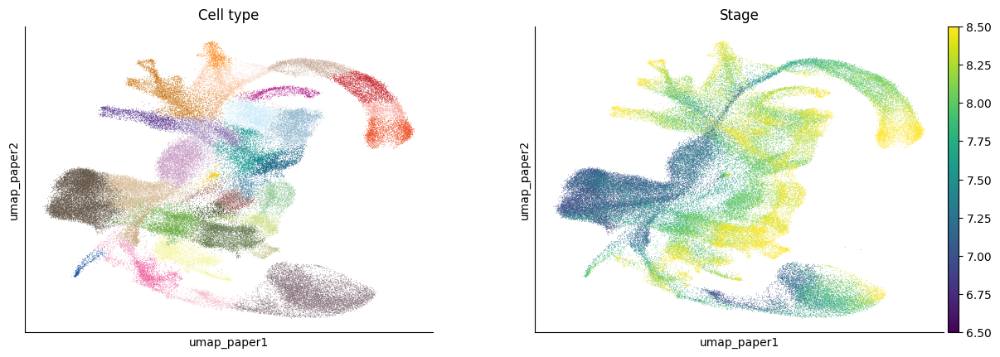

In [11]:
fig = sc.pl.embedding(adata, basis='umap_paper', 
                      color=["colored_celltypes", "stage_numeric"], ncols=2, cmap='viridis', legend_loc='down', title=["Cell type", "Stage"], return_fig=True)

In [12]:
time_key = 'stage_numeric'
embedding_key = 'X_pca'
cell_type_key = "colored_celltypes"

In [13]:
adata = adata[:,adata.var['highly_variable']]

### traj loss

In [137]:
for i in range(20):
    model, _ = pygot.tl.traj.fit_velocity_model(adata, time_key=time_key, embedding_key=embedding_key, 
        
        device=device, path='../pygot_data/Perturbation/mouse/')

    mioflow, _ = pygot.external.MIOFlow_interface(adata, time_key=time_key, gae_embedded_dim=30,  use_density_loss=True, batch_size=256, embedding_key=embedding_key, use_emb=False, use_gae=False, exp_dir='./tmp')

    otcfm_model, history = pygot.external.OTCFM_interface(adata, iter_n=3000,time_key=time_key, embedding_key=embedding_key, device=device)
    
    torch.save(model, './benchmark_model/GOT/01.2_trajectories/gastrulation/gas_{}.pkl'.format(i))
    torch.save(mioflow, './benchmark_model/MIOFlow/01.2_trajectories/gastrulation/gas_{}.pkl'.format(i))
    torch.save(otcfm_model, './benchmark_model/CFM/01.2_trajectories/gastrulation/gas_{}.pkl'.format(i))

loading saved shortest path profile


loss :3142.3575  best :3119.6907: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [05:17<00:00,  6.30it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 772.41638


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 760.04727


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 739.37375


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 751.6183


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 728.09254


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 742.99751


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 705.33788


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 723.16734


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 683.5785


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 707.0154


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 689.74003


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 685.46934


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 669.66606


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 677.71144


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 671.38898


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 661.94942


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 655.20459


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 652.21356


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 650.68448


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 640.93853


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8561.37695


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36223.55973


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4086621.49656


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15920.00088


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9261.15377


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17532.18737


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9378.84554


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16930.67755


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9430.88867


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16719.19682


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9394.34295


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15855.71793


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9458.61222


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15678.27082


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9279.75298


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15532.65108


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9139.25213


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15407.07103


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9147.47791


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14955.72345


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9280.88488


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14706.50762


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9320.60906


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14655.7001


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9123.58491


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14652.09403


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9077.62556


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14335.92456


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9112.43331


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14069.20338


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8985.69107


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14112.91618


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9004.8664


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13952.33158


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9081.23006


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13823.28508


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8958.042


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13868.67155


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9010.46758


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13618.47335


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8880.14294


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13592.71228


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8887.92925


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13428.22793


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8941.35449


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13456.7896


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8915.57971


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13298.43745


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8800.98846


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13095.6467


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8902.54142


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13109.18349


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8976.72706


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13072.44031


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8881.2672


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13069.79102


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8787.05903


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13006.77352


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8874.58989


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12956.06084


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8697.07085


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12666.9656


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8799.50534


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12740.82132


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8751.59129


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12654.64754


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8776.93616


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12502.72611


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8735.66195


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12472.65325


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8820.38643


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12407.25206


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8873.70459


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12404.2111


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8583.24229


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12287.32056


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8722.01451


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12146.30437


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8842.44979


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12112.66954


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.6448 best :11.6448: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:21<00:00,  7.87it/s]


loading saved shortest path profile


loss :3145.6954  best :3059.4953: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [04:40<00:00,  7.12it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 770.32015


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 775.65063


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 738.23835


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 742.6764


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 719.80177


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 734.01931


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 704.68661


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 734.58871


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 692.88061


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 702.58174


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 683.81722


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 705.9643


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 671.19197


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 692.85223


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 675.07366


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 671.9185


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 650.4196


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 674.27963


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 657.71863


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 667.49968


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7658.29704


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 39668.55235


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15413.05593


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15489.57276


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10547.36973


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12626.43512


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9749.67366


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11628.6216


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9204.92363


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11068.83467


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8854.47566


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10431.53309


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8512.72639


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9885.6232


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8382.47443


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9473.40554


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8082.23507


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9007.82391


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7934.25742


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8697.86039


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7845.52236


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8446.20508


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7755.55622


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8221.70927


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7705.09265


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8051.52196


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7631.06768


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7935.17305


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7534.91187


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7749.1053


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7526.52421


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7614.97208


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7510.39138


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7501.6552


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7349.92369


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7497.22017


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7358.75296


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7341.07506


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7349.43794


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7272.59869


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7286.23273


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7216.72901


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7246.33047


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7175.59745


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7282.844


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7081.79833


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7234.28615


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7073.5133


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7131.1292


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6973.08595


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7153.54071


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6938.28209


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7144.3956


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6931.13156


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7119.14848


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6840.43951


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7014.57623


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6798.69859


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7034.39482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6789.69247


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7097.46959


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6695.12512


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6967.91575


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6743.8626


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6977.06132


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6674.77373


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6960.07439


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6679.1149


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6885.86618


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6602.62577


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6868.18592


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6563.15097


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6735.27345


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6616.69302


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6789.63388


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6584.64702


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6799.7884


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6562.37029


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6818.74501


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6519.08102


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.5935 best :11.5935: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:58<00:00,  8.37it/s]


loading saved shortest path profile


loss :3118.6144  best :3059.6010: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [05:26<00:00,  6.12it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 793.82936


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 766.73509


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 733.20099


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 751.95281


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 713.52586


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 723.0825


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 709.18716


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 719.69465


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 693.83105


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 703.8023


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 682.24456


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 707.14016


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 672.0773


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 682.93435


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 665.71157


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 671.40584


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 666.5037


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 662.84656


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 664.75146


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 665.0941


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7183.00191


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 172427.2209


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38154.17588


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14311.55664


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18778.45331


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12612.89172


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16405.3104


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12018.2443


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15041.28748


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11788.30419


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13901.77249


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11456.35904


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13219.39686


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11254.36742


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12771.81381


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11114.62735


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12193.4908


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10942.73175


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11837.90949


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10717.47711


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11319.2706


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10559.68195


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11070.52513


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10392.50914


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10887.82432


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10342.28112


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10527.27895


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10263.00037


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10461.06096


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10157.11797


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10318.2024


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10013.71612


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10184.29047


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9958.17773


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9963.21258


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9845.52374


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9884.74678


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9732.12529


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9750.76953


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9607.02174


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9642.74891


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9590.48896


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9458.28992


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9430.23382


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9443.1197


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9338.84055


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9259.34689


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9296.72577


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9249.44407


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9234.35917


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9182.13757


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9113.36366


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9051.2028


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9095.32113


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9020.80954


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9054.98763


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9049.3812


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9004.87236


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8897.00215


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8924.11452


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8692.71636


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8877.29533


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8775.01899


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8822.96973


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8754.5117


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8669.7622


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8655.49721


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8667.10324


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8746.51951


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8683.13795


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8568.08333


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8527.07939


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8492.09224


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8466.29305


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8494.19632


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8543.19657


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8485.9396


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8537.17346


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8488.27518


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8422.22222


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.3749 best :11.3749: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:21<00:00,  7.86it/s]


loading saved shortest path profile


loss :3242.0250  best :3210.8836: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:44<00:00,  8.89it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 782.49368


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 760.50082


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 735.2224


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 749.83773


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 714.36084


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 731.20247


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 700.67924


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 711.98413


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 688.67624


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 691.3503


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 679.80677


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 687.07125


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 668.35859


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 668.33163


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 665.30608


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 656.67714


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 651.73108


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 655.79247


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 648.96126


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 652.86043


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7516.75204


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1760409339783840.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17377.52886


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 497313.06973


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19090.10979


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 525921.78252


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18978.85558


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 503388.24793


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18786.22237


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 499480.37461


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18887.73888


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 518489.98438


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19141.57475


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 496230.18385


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18940.82067


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 477575.94937


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18799.89482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 481327.83877


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18919.41008


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 480389.87023


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18847.61659


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 475016.1815


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18863.7904


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 458204.06128


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18861.10146


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 460667.72067


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18881.65018


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 471098.90399


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18912.76275


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 464138.57031


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19001.45877


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 450825.47118


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18728.01048


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 453284.36425


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18544.05583


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 460268.51404


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18652.12934


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 447363.75148


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18657.70331


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 444494.65385


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18773.48515


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 439018.96937


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18788.56469


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 424312.75284


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18904.69699


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 433766.70169


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18864.04496


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 422096.90927


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18814.16541


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 428098.17421


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18645.11338


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 424572.87932


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18749.19272


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 405394.48492


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18746.14323


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 411180.91314


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18617.91371


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 402069.87521


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18467.14702


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 389282.44343


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18539.7769


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 414403.3862


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18400.06017


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 390266.0148


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18466.56269


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 387047.80592


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18641.62263


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 394324.789


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18544.0692


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 377703.23755


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18663.56763


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 369616.97791


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18358.65253


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 370601.84508


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18600.14525


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 378227.2469


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18365.94963


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 368041.78216


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18582.76745


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 372960.09449


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.5797 best :11.5548: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:19<00:00,  7.91it/s]


loading saved shortest path profile


loss :3231.3767  best :3156.6969: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [04:10<00:00,  7.99it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 770.9046


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 764.3329


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 737.60521


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 741.75872


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 720.08425


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 741.81761


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 711.18347


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 742.8188


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 705.22968


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 708.60351


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 679.88266


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 702.62375


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 671.92404


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 685.21216


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 663.27778


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 670.76473


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 657.4028


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 667.99671


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 656.33517


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 659.44906


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8192.34361


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 73306745.24208


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13324.83605


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15650.28198


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14556.62


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15992.85149


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14512.04229


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15391.67278


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14437.77836


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14925.08061


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14253.70432


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15253.16875


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14234.82439


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14873.07327


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14097.1078


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14443.50017


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14089.7686


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14493.62293


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14289.73274


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14408.2402


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13810.47831


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14106.44268


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13210.73871


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14046.78505


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12950.71099


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13971.39445


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12800.13913


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13796.97589


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13002.06385


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13617.86482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12697.65307


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13700.86326


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12720.22714


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13382.53749


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12573.90316


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13399.16382


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12544.02134


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13397.07945


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12530.45829


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12996.21389


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12460.25153


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13079.0668


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12278.75174


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13115.2282


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12406.99669


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12973.50884


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12164.87788


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12908.22106


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12259.22802


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12970.2804


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12089.61354


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12866.44374


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12305.01238


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12834.53383


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12005.80924


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12789.05764


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12201.59707


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12814.75189


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11998.73205


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12721.58829


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12008.70885


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12616.22786


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11992.41568


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12690.91692


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11860.58009


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12583.73404


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11689.713


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12451.26233


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11757.09362


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12416.46133


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11758.50154


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12346.17181


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11574.52751


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12308.63961


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11771.07288


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12228.64428


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11572.68676


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12205.90479


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11494.86625


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12274.71331


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.5742 best :11.5742: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:44<00:00,  8.71it/s]


loading saved shortest path profile


loss :3086.9950  best :3060.7714: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [04:58<00:00,  6.70it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 777.62204


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 769.33528


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 737.388


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 741.2027


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 734.44466


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 734.92162


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 709.18187


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 725.73132


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 713.90266


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 717.49707


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 693.86014


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 687.20327


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 685.91326


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 672.05285


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 664.93242


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 668.12558


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 664.38748


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 648.8225


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 657.85986


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 653.03274


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7660.35414


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 239883.72587


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27118.4667


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14230.62738


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13288.14173


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13406.8845


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11997.18903


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13072.8671


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11312.86574


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12700.21848


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10923.27117


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12443.92081


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10640.0545


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12256.39817


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10521.33189


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12020.88049


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10197.19871


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11880.21275


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10039.02052


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11679.75229


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9929.92639


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11508.06144


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9950.25865


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11250.5776


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9826.92255


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11298.73285


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9826.10012


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11052.82995


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9651.73299


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11049.09364


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9517.36251


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10889.16583


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9485.14225


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10837.42353


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9370.14136


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10741.49409


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9373.22128


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10590.84891


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9419.64413


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10504.33592


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9320.4536


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10273.00325


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9227.85741


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10250.15525


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9292.72621


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10178.923


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9232.28246


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10115.2992


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9208.98118


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9963.49364


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9127.36133


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9896.27835


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9174.85049


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9866.74317


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9081.65895


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9643.29511


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9153.90052


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9591.59592


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8977.90455


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9456.51395


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8985.2799


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9361.98792


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8931.17873


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9225.21742


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8977.83591


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9188.3808


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9014.78341


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9088.08121


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8792.95207


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9067.89944


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8743.52111


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8867.57643


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8886.71694


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8769.5249


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8714.22124


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8778.7715


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8748.85905


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8635.02643


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8708.27101


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8569.95502


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.3635 best :11.3635: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:55<00:00,  7.21it/s]


loading saved shortest path profile


loss :3221.4523  best :3128.4217: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:40<00:00,  9.07it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 783.04826


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 778.1998


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 746.94579


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 755.15502


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 727.27574


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 735.76514


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 725.30095


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 728.34944


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 698.4446


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 709.17071


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 703.17638


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 693.99376


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 680.93586


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 693.72771


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 669.7761


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 675.25633


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 661.06992


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 663.11173


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 662.36092


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 656.61962


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7747.31293


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14386.90455


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 80021.68179


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18439.94623


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9363.08035


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10866.25808


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9042.59423


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10652.0541


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8829.64756


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10255.82732


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8534.51615


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10094.13475


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8451.86986


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9817.85668


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8314.28903


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9466.82809


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8115.98905


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9059.54735


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8010.33854


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8672.91515


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7792.58594


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8376.6107


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7674.98945


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7932.6139


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7545.55426


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7702.54521


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7472.72971


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7458.74124


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7337.47433


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7266.59161


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7281.87711


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7156.58472


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7307.08675


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7019.42683


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7152.30324


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6948.44623


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7241.73079


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6870.90556


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7105.42497


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6791.26328


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7051.28737


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6730.98697


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6972.7017


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6716.17794


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7092.5091


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6584.71247


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6916.63165


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6595.66186


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6910.53089


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6561.00305


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6898.84751


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6550.62057


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6823.11258


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6370.55553


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6758.45987


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6413.38659


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6791.68809


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6293.66965


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6652.92618


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6337.40658


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6761.85571


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6330.20977


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6657.67619


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6258.31247


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6682.58883


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6227.11248


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6689.41447


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6232.87711


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6675.51703


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6267.8995


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6676.7807


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6182.94362


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6608.55976


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6150.22504


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6582.80647


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6143.63858


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6489.22588


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6084.32764


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6549.30869


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6115.61119


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.4189 best :11.4189: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:20<00:00,  9.35it/s]


loading saved shortest path profile


loss :3123.5998  best :3081.9309: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:05<00:00, 10.78it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 786.87841


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 777.77079


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 728.44586


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 746.69009


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 722.0574


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 728.1671


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 700.19711


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 723.13744


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 692.34845


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 693.97523


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 677.69651


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 691.9555


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 677.65719


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 661.845


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 662.78057


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 663.47303


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 665.84051


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 655.48227


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 649.0838


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 652.75006


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7900.03809


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 212894046.76442


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26521.00716


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 86008.45137


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33298.29381


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 66788.26318


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33928.49148


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 53917.59984


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 32993.32784


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 49476.54999


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 32367.93048


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 41191.4079


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30353.1817


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 39558.8899


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30450.19987


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37693.92476


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29974.09632


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35598.74605


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29514.55845


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33500.90482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27547.69125


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 32548.82737


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27467.36456


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 32121.09233


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26704.71846


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30634.61693


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25616.10741


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29714.049


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25502.21134


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29230.80382


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24798.0001


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28084.06813


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23841.41248


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27616.26381


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23909.62793


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25832.60956


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23173.23242


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26418.40375


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22511.33782


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24540.57934


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22693.37144


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24508.15205


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22177.77362


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24899.54822


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21902.05504


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24371.1256


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21318.39023


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23703.84471


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21126.81404


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22812.4554


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20696.82691


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23396.71377


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20762.14252


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22570.119


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20268.87641


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22530.77605


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19709.55535


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22524.34356


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20002.91225


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20962.88546


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19955.32524


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22106.63389


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18885.49419


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21556.81864


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19180.79653


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21064.80071


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18944.28023


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20632.60458


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18731.2647


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20676.30111


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18586.01379


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20389.40196


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18197.6527


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20409.53502


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18346.04657


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20166.49976


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17967.1084


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19968.9102


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17770.58148


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19506.28413


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.2871 best :11.2871: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:22<00:00,  9.31it/s]


loading saved shortest path profile


loss :3127.7257  best :3107.6935: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:08<00:00, 10.61it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 783.97756


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 777.71318


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 734.5451


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 746.64501


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 729.85577


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 724.74641


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 707.51345


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 719.74707


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 696.00798


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 697.65391


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 686.53846


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 690.2543


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 682.49164


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 680.95103


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 681.71838


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 675.12607


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 666.01061


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 664.5117


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 661.76488


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 662.63077


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7892.56681


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 49099.14396


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18510.36223


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12893.42701


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11480.81271


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11177.1059


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10349.32787


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10480.49402


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9516.39985


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10046.02096


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9163.89766


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9761.13209


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8695.56513


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9433.34093


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8447.89363


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9281.97958


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8124.29588


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9012.75324


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8027.30652


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8833.38715


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7972.94009


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8748.41837


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7724.52649


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8569.4101


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7663.58701


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8478.57919


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7610.46625


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8389.78167


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7456.73701


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8266.79791


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7431.83141


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8209.58558


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7369.4287


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8056.04264


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7256.08975


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8035.57316


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7143.27584


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7969.50134


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7159.28772


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7780.94917


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7090.58265


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7665.2145


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6957.08621


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7501.50693


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6971.60761


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7346.90442


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6905.11238


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7231.56771


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6884.84202


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7123.64954


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6833.95137


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6988.58861


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6838.7236


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7056.43199


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6770.81719


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6807.30352


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6802.50699


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6724.60295


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6694.57316


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6685.59864


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6755.71638


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6557.48655


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6739.97412


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6485.44851


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6587.75


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6376.37094


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6645.5312


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6418.58192


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6609.34451


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6291.08534


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6599.57532


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6265.44967


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6541.81293


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6204.59015


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6649.75705


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6190.78789


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6602.54596


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6129.63222


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6583.66052


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6087.64784


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.4396 best :11.3662: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:20<00:00,  9.37it/s]


loading saved shortest path profile


loss :3200.6461  best :3133.7955: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:08<00:00, 10.61it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 772.1195


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 770.23757


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 745.20919


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 754.39322


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 711.0934


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 734.89843


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 700.6011


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 707.21177


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 704.81024


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 714.24313


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 682.8054


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 692.47203


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 666.26026


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 685.24903


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 672.39829


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 672.01619


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 658.68365


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 668.7745


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 655.03136


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 663.75884


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7749.79581


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 61294906873.52008


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23010.88271


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38323.33528


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31672.44169


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38945.23436


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31357.76038


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37249.45244


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31549.84917


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 40463.33612


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30854.7262


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 39916.02052


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31108.75141


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36558.74886


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30735.66005


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38203.06594


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31494.67953


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38581.49972


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29885.47528


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37212.77098


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30858.89331


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38954.07434


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30020.127


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36554.7753


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29782.30297


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37060.4065


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29441.65557


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37149.80696


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30143.50696


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37026.50548


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29841.16954


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 39706.85182


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29574.84422


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37911.42319


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30159.97539


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36117.67803


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29591.59002


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37089.57919


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29309.92959


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36370.72759


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29758.52914


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 32759.81397


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29780.81334


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36370.98108


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29698.24007


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36835.75226


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29303.0336


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33731.73296


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29408.32686


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36258.58652


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28199.32003


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35223.68888


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29107.29633


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 32900.34501


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29410.02579


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33845.47709


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28195.42561


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35758.78097


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29198.86587


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33299.17195


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28320.91635


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35256.69851


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28423.70775


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33779.73375


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28266.80678


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33568.63644


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27877.19955


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 34282.4785


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27569.73756


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 34044.23763


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27592.46602


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 34934.89909


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27849.91548


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 34573.31128


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27533.36755


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33085.98746


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27292.16498


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 30418.80736


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27815.63644


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31716.83764


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.4195 best :11.4195: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:22<00:00,  9.30it/s]


loading saved shortest path profile


loss :3185.2330  best :3131.1843: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:10<00:00, 10.49it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 782.10138


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 768.46215


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 738.45286


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 744.02087


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 711.33321


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 727.01875


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 701.31666


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 712.55431


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 692.40194


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 703.98707


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 682.89232


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 685.08804


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 673.90975


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 683.74535


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 661.54213


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 669.69699


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 655.69587


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 673.91819


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 648.14503


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 667.07617


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7639.43728


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 50379508.3284


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 39413.44012


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35814.6154


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 50239.51754


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 32168.50612


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 45003.19947


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28589.98004


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42309.84648


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24967.28422


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38830.94844


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23692.12865


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36015.94349


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22647.42554


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35491.01442


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22826.78626


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 33897.86921


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21361.46496


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31856.41609


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20497.20082


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31091.5396


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20215.91625


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 29861.26147


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19713.42306


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28736.72567


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18961.55047


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28932.32386


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18890.58816


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27770.90182


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18793.19244


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26867.4346


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17995.12067


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26352.64011


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17666.46102


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25847.99284


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17328.76704


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24944.57427


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17743.08253


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24568.65014


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17071.38978


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23685.94778


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16779.91137


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23118.77826


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16740.79969


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22949.4519


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16633.75438


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22292.81918


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16356.11295


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21889.85737


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16308.05248


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21738.72422


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16336.72459


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21468.15002


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15919.84275


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20795.30482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 16045.22494


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20482.76663


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15704.60305


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20113.96229


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15840.78912


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19971.56435


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15741.20774


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19984.10568


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15724.11319


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18928.13325


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15550.68893


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19102.59217


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15486.05493


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18837.28188


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15304.66101


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18495.54931


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15430.55451


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18185.71252


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15284.36693


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18220.08945


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15282.03682


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17689.95556


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15179.33145


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17796.55584


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15022.5681


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.4729 best :11.4729: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:22<00:00,  9.30it/s]


loading saved shortest path profile


loss :3098.2105  best :3071.5827: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:09<00:00, 10.55it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 782.49869


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 766.57792


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 740.91357


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 759.36196


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 728.60543


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 729.90403


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 710.07699


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 715.86227


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 690.59832


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 709.56672


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 689.17943


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 684.46748


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 674.58


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 684.04807


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 674.76716


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 668.12346


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 655.07576


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 653.50298


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 650.89418


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 653.64951


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7325.50826


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 354568449.26411


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 65864.69093


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35306.24159


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 90882.05936


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 31002.53915


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 85461.69091


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28937.72886


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 81574.43001


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27953.28595


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 76822.34511


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27700.1352


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 73348.60895


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26978.51315


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 70365.85017


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25930.49223


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 67752.1158


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25092.72295


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 64597.59076


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24490.35064


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 62933.57772


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 24583.26082


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 61177.48821


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 23290.56154


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 58932.08175


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22177.28135


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 58225.3188


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22082.53969


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 55936.10518


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22320.21808


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 54937.46383


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21502.67979


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 53153.30324


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21278.94835


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 51452.97352


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21313.70002


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 50150.26958


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21239.63657


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 49560.96937


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20664.73001


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 48876.56152


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20487.87049


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 46415.57483


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19436.05388


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 46529.72994


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20425.57116


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 45492.62748


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19806.24092


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 44267.58891


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19701.69852


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 43376.67006


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19425.19713


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42759.76949


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19354.43904


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42059.63252


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19234.76671


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42260.84155


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18859.09481


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 40414.92077


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19023.10141


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 39677.45915


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18306.33923


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 40139.0915


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18642.45168


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38870.44555


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18038.68377


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38344.33754


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18127.93382


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37941.42626


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18529.68174


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37255.92612


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18465.08481


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36963.44173


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17939.10399


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 36019.1479


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18418.98341


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35867.11535


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 17837.28328


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35486.76395


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18016.64977


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.5348 best :11.5348: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:19<00:00,  9.38it/s]


loading saved shortest path profile


loss :3187.1292  best :3186.4207: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:07<00:00, 10.68it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 789.91844


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 753.86013


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 741.12567


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 736.91011


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 726.35115


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 738.317


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 705.90514


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 714.3277


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 679.11228


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 691.98778


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 678.86143


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 682.70033


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 678.72067


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 667.17856


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 669.09279


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 658.30531


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 659.37088


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 647.67314


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 646.64285


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 647.69585


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8367.65693


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42197.77972


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18433.25703


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14730.09173


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11390.36262


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10133.92487


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9865.52064


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8928.21741


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8958.23548


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8360.47784


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8500.49015


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8005.95732


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8272.78565


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7751.44026


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7871.00345


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7458.90103


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7798.39228


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7335.4712


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7703.96601


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7181.72396


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7492.30184


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7024.06905


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7414.54263


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6881.54687


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7336.696


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6777.45657


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7243.0239


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6688.01381


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7096.56067


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6634.98211


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7005.06415


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6512.56871


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6998.7573


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6445.57545


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6992.31295


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6386.8932


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6888.04494


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6274.09738


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6847.72919


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6264.9507


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6796.6847


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6187.64288


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6733.44656


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6164.88442


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6781.30848


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6136.60908


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6710.96889


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6064.96274


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6661.65341


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6033.17791


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6582.26507


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5985.47224


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6682.88514


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5937.72191


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6596.00845


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5900.52588


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6523.03794


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5939.85595


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6481.80722


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5831.54552


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6426.20219


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5816.15886


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6528.81537


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5841.69332


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6419.24062


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5799.17191


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6407.83188


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5733.10901


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6443.3514


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5731.08609


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6406.5059


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5749.20848


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6422.15242


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5742.21029


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6419.1025


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5727.77322


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6395.46561


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5712.14147


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6314.14043


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5695.74774


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.4478 best :11.4478: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:22<00:00,  9.31it/s]


loading saved shortest path profile


loss :3140.5115  best :3118.1832: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:08<00:00, 10.61it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 785.11017


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 778.99688


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 725.52195


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 742.62377


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 721.37026


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 721.11241


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 700.47365


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 704.80864


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 689.55453


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 690.04973


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 674.8424


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 671.22191


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 672.17747


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 660.14658


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 653.97076


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 664.78586


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 649.45688


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 651.48765


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 636.15403


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 641.24094


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7030.70357


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 525256514929.6767


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22473.72074


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13177.24963


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27693.34054


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13127.24617


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27492.55827


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13290.78692


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27615.2109


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13253.11935


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27282.42886


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13174.45409


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27233.59306


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13159.41138


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27340.49362


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13096.97693


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27726.86346


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13128.15828


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27715.42291


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13200.50714


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27018.57666


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13198.71753


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26753.51283


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13311.39975


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26737.41696


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13177.89438


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27056.33698


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13243.41561


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26831.59919


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13169.25929


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27475.23921


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13283.93895


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27052.59216


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13156.52971


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26551.45257


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13274.38885


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26507.86852


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13172.67051


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 27138.36686


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13087.04763


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26852.49233


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13138.55132


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26317.90097


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13087.76542


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26444.85152


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13207.63273


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26877.70291


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13039.75133


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26707.48342


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12962.83977


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26352.93473


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13070.33686


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26536.03826


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13299.89626


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26187.74275


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13149.68645


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26352.34438


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13079.54406


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26489.85364


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13085.66855


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26541.67123


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13105.12258


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26284.3338


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13070.29556


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26235.76536


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12986.87205


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26177.96072


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13022.52647


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26249.46476


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13015.33993


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25850.2869


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13149.99163


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25742.93121


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13050.66367


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25897.14506


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13033.974


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 26196.89572


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13047.41935


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 25804.18771


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13125.66307


Posttraining Epoch: 0it [00:00, ?it/s]

loss :11.4963 best :11.4963: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:21<00:00,  9.32it/s]


In [14]:
X_start = torch.Tensor(adata[adata.obs[time_key] == 6.5].obsm[embedding_key]).to('cuda')
X = torch.Tensor(adata.obsm[embedding_key])
X = X.to('cuda')
cell_time = adata.obs[time_key].to_numpy()
got_loss, mioflow_loss, otcfm_loss = [], [], []
for i in tqdm(range(20)):

    model = torch.load('./benchmark_model/GOT/01.2_trajectories/gastrulation/gas_{}.pkl'.format(i)).to('cuda')
    traj = odeint(model, X_start, torch.Tensor(np.linspace(6.5, 8.5, 100)), method='rk4').detach().cpu().numpy()
    got_loss.append(traj_loss(traj, X, cell_time, True))
    
    mioflow = torch.load('./benchmark_model/MIOFlow/01.2_trajectories/gastrulation/gas_{}.pkl'.format(i)).to('cuda')
    try:
        traj = odeint(mioflow.func, X_start, torch.Tensor(np.linspace(6.5, 8.5, 100)), method='rk4').detach().cpu().numpy()
        mioflow_loss.append(traj_loss(traj, X, cell_time, True))
    except:
        print('Fail MIOFLOW')

    otcfm = torch.load('./benchmark_model/CFM/01.2_trajectories/gastrulation/gas_{}.pkl'.format(i)).to('cuda')
    traj = odeint(otcfm, X_start, torch.Tensor(np.linspace(0, 8, 100)), method='rk4').detach().cpu().numpy()
    otcfm_loss.append(traj_loss(traj, X, cell_time, True))

100%|█████████████████████████████████████████████████████████████████████████████████| 20/20 [00:30<00:00,  1.51s/it]


In [15]:
got_res = pd.DataFrame(got_loss, columns=['Loss'])
got_res['method'] = 'GOT'
mioflow_res = pd.DataFrame(mioflow_loss, columns=['Loss'])
mioflow_res['method'] = 'MIOFlow'
#mioflow_res = mioflow_res.loc[mioflow_res.Loss < 100]
otcfm_res = pd.DataFrame(otcfm_loss, columns=['Loss'])
otcfm_res['method'] = 'OT-CFM'

<Axes: xlabel='method', ylabel='Loss'>

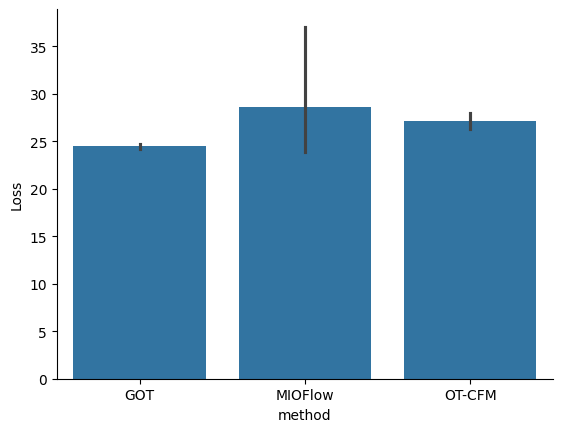

In [16]:
import seaborn as sns
plot_df = pd.concat([got_res, mioflow_res, otcfm_res])
sns.barplot(plot_df, x='method', y='Loss')
#plot_df.to_csv('./results/01.2_trajectories/gastrulation_traj_real.txt', sep='\t')

In [17]:
adata.obsm['X_pumap'], map_model = pygot.pp.learn_embed2vis_map(adata, embedding_key, vis_key='X_umap_paper')

Epoch [40/100], Train Loss: 0.2317, Val Loss: 0.3951:  39%|██████████▏               | 39/100 [01:05<01:41,  1.67s/it]


Early stopping triggered
Test Loss: 0.2466


In [18]:
model = torch.load('./benchmark_model/GOT/01.2_trajectories/gastrulation/gas_2.pkl').to('cuda')
mioflow = torch.load('./benchmark_model/MIOFlow/01.2_trajectories/gastrulation/gas_5.pkl').to('cuda')
otcfm = torch.load('./benchmark_model/CFM/01.2_trajectories/gastrulation/gas_3.pkl').to('cuda')

In [19]:
idx = adata[adata.obs[time_key] == 7.].obs.sample(n=100).index

In [20]:
np.sort(adata.obs[time_key].unique())

array([6.5 , 6.75, 7.  , 7.25, 7.5 , 7.75, 8.  , 8.25, 8.5 ],
      dtype=float32)

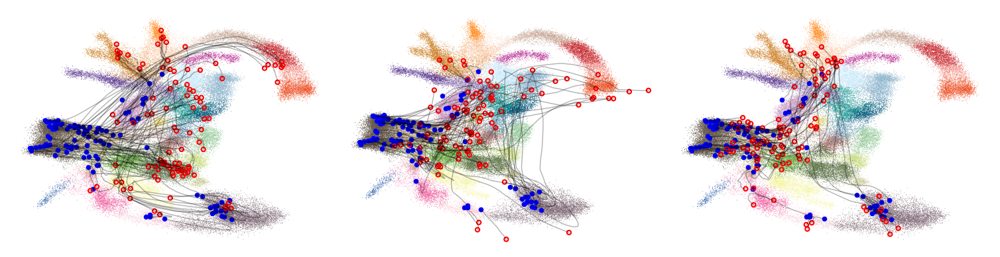

In [21]:
fig, axes = plt.subplots(1,3, figsize=(6.4*3, 4.8))
traj = pygot.tl.traj.simulate_trajectory(adata[idx], model, embedding_key, start=7., end=8.5)
lowd_traj = map_model.transform(traj)
pygot.pl.plot_trajectory(adata, lowd_traj,  basis='pumap', ax = axes[0], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})

traj = pygot.tl.traj.simulate_trajectory(adata[idx], otcfm, embedding_key, start=2, end=8.)
lowd_traj = map_model.transform(traj)
pygot.pl.plot_trajectory(adata, lowd_traj,  basis='pumap', ax = axes[1], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})

traj = pygot.tl.traj.simulate_trajectory(adata[idx], mioflow.func, embedding_key, start=7., end=8.5)
lowd_traj = map_model.transform(traj)
pygot.pl.plot_trajectory(adata, lowd_traj,  basis='pumap', ax = axes[2], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})

fig.subplots_adjust(wspace=0.01, hspace=0.2)  


# Cell 19

In [22]:
adata = sc.read('../pygot_data/iPSC.h5ad')

In [23]:
adata
time_key = 'day'
embedding_key = 'X_pca'
adata.obs['stage_int'] = adata.obs[time_key].replace(dict(zip(np.sort(adata.obs[time_key].unique()), range(len(np.unique(adata.obs[time_key])))))).astype(int)
time_key = 'stage_int'
cell_time = adata.obs[time_key].to_numpy()

In [140]:
for i in range(20):
    model, _ = pygot.tl.traj.fit_velocity_model(adata, time_key=time_key, embedding_key=embedding_key, 
         linear=False, v_centric_batch_size=64,
        device=device, path='../pygot_data/')
    
    mioflow, _ = pygot.external.MIOFlow_interface(adata, time_key=time_key, gae_embedded_dim=30,  use_density_loss=True, batch_size=256, embedding_key=embedding_key, use_emb=False, use_gae=False, exp_dir='./tmp')

    otcfm_model, history = pygot.external.OTCFM_interface(adata, iter_n=3000,time_key=time_key, embedding_key=embedding_key, device=device)
    
    torch.save(model, './benchmark_model/GOT/01.2_trajectories/cell19/cell19_{}.pkl'.format(i))
    torch.save(mioflow, './benchmark_model/MIOFlow/01.2_trajectories/cell19/cell19_{}.pkl'.format(i))
    torch.save(otcfm_model, './benchmark_model/CFM/01.2_trajectories/cell19/cell19_{}.pkl'.format(i))

loading saved shortest path profile


loss :5763.9162  best :5763.9162: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:27<00:00,  2.67it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 275.56826


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 275.27606


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 272.77493


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 263.63981


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.41208


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.77782


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.1219


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 258.51011


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.26191


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.07172


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.39858


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.91244


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.25112


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.78839


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.82497


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.22467


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.77885


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 251.37288


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.5635


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 251.97259


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3439421739648962.5


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 51429.56488


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1481575188221.4885


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 73375.38754


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 776163561613.1096


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 74090.48259


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 469633748533.6657


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 75004.20469


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 357572394660.7435


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 74423.23287


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 296917289556.27094


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 76754.87005


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 213969105116.96967


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 75905.5469


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 201054286027.15375


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 76373.51273


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 190914702368.16837


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 76368.95013


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 177864369278.91727


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 75932.43573


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 144488453049.25836


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 75308.88342


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 135364728022.47232


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 75180.66617


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 111485999043.22105


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 74612.33115


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 124811131382.15681


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 74083.70175


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 106999084942.83762


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 74353.32414


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 105755880597.68596


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 74962.20598


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 86875326509.3502


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 73783.83594


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 87266981535.61368


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 73751.02342


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 80998293826.29935


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 72878.61565


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 81169313102.96524


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 73155.50803


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 65130145451.31825


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 71558.35874


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 66000470444.53097


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 72013.31695


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 63786350879.73148


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 71163.29377


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 54994920074.20583


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 71696.13916


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 63922094070.56747


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 71934.42555


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 57254482675.77992


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 71325.33483


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 49937881836.89092


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 70442.81598


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 52026165936.9416


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 70380.50367


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 46339264755.74512


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 69662.07735


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 51559095196.4937


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 70164.15138


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 47097654588.35725


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 69394.4008


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 43915677810.68603


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 69054.59999


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 41818058479.24983


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 68585.64511


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 39856685713.84436


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 68038.80889


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 40495451605.55738


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 68298.89956


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 38826883701.49136


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 67634.88517


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35009968334.6659


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 66647.75341


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 37015301503.97017


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 67272.12665


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 35548184151.06539


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 66746.96761


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 32547097952.03771


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 66330.14536


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0766 best :7.0766: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:33<00:00,  2.04it/s]


loading saved shortest path profile


loss :5438.0476  best :5438.0476: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:27<00:00,  2.68it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 273.27291


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 277.15056


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 269.92979


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.51799


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.68773


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.47521


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.67743


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.84721


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.31767


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.29637


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.68173


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.99892


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.70224


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.53205


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.8287


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.9898


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.48857


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.30494


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 561.17357


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 383.07814


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 423644.4412


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.59944325848102e+20


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 112823.59568


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2.4718855021450782e+20


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2857588.96149


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2.1528870388630077e+20


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 28085682089.15039


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.616608043979955e+20


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2908968564481.596


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.1534262968867145e+20


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4513997608843.054


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.1767507691532272e+20


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 20816928099.08039


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.0518042502773739e+20


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5350858130442.029


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9.035330042287931e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4248485208726.1436


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5.8496647659450155e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 112388554185379.11


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6.666311786377012e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 94261670301270.03


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6.278403178851923e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 43650399899364.484


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5.3052642231903805e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 14084417986252.928


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4.1000479728208134e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15581731425656.1


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.895778549668969e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19101322662124.355


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.91924055951205e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18978571154177.98


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.095180365734359e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 18459528813767.71


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2.6795563020745925e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3294126618621.3965


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2.353418078159317e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1164412596236.0608


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.5508991064156166e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 943147752590.055


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.8003914358241313e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1346148768124.311


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.2768718137062945e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1866089947606.6047


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.210530409859526e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2369562510866.2476


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.0545857397418267e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4202883390441.8022


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7.755557319569668e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11386875056419.947


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7.659052813029687e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 49831852202475.25


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4.412967353374682e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 187749815824268.25


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.9154686513455964e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 550602348609162.4


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.944042988217565e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 916168272396375.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.9285710865614536e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1697673002140359.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.7406997063813944e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1839390384631723.5


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.6268378087016013e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2083293331287456.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2.492447122008491e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1894347302625383.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2.0188014038857981e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1905216625102318.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.2540111318225638e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1733519928585773.5


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.7120402481124388e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1646575696080696.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.4943985270539405e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1638750584704335.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.1578519329881623e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1737430134447761.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.0606824257628782e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1714072215657997.5


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.1559675893380608e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1684177713787113.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8.026160019561229e+17


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0700 best :7.0658: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:35<00:00,  2.03it/s]


loading saved shortest path profile


loss :6350.4772  best :6350.4772: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:34<00:00,  2.65it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 275.43473


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 279.36911


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 271.3291


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 266.4224


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.35142


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 258.90663


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.32032


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.75867


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 260.26504


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.05482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 283.99214


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 19971.34614


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7395042.83906


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 275382926.2625


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 34856217258.7


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7706869.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4583513446.4


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 21705350.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1208313833.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 130795370.8


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0422 best :7.0422: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:30<00:00,  2.04it/s]


loading saved shortest path profile


loss :5835.0130  best :5835.0130: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:41<00:00,  2.63it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.47182


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 278.58655


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.89544


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.39178


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 266.91346


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.78702


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 260.724


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.78992


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.89782


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.23916


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.56261


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.99443


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 263.14275


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.62656


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 260.46875


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 211425634.6746


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 92841795328.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 160182478.4


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2856088349504.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13853969088512.0


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0593 best :7.0593: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [30:59<00:00,  1.61it/s]


loading saved shortest path profile


loss :6008.1168  best :6008.1168: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [13:46<00:00,  2.42it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.17233


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 276.66944


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 269.30125


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.95027


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 266.8071


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 261.08148


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 261.59159


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.74376


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 258.06257


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.33092


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.39978


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.24717


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.52888


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.67135


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.24044


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.08398


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.71222


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.59866


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.37461


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5327400.17093


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0426 best :7.0426: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [28:55<00:00,  1.73it/s]


loading saved shortest path profile


loss :6005.9020  best :6005.9020: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:44<00:00,  2.62it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.53981


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 278.58173


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 268.59582


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.65082


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 264.27266


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 261.13042


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 260.21067


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.12741


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.17003


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.0697


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.92973


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4.472602973564495e+17


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8552523272657306.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1.6247422025872703e+19


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 774893863960576.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9.995979533776114e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 271595675320320.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6.243132108335953e+18


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 102311479214080.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4.3952552359101466e+18


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0677 best :7.0677: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:35<00:00,  2.03it/s]


loading saved shortest path profile


loss :5869.6131  best :5869.6131: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [13:24<00:00,  2.49it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 273.79614


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 276.20319


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 272.3714


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.85809


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 264.11431


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.72502


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.8302


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.12243


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 258.442


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.78541


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.77136


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.6483


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.23575


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.12209


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.39463


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.70359


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.74629


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 251.42337


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 251.78597


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.19622


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3.3123419854951124e+16


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 270159.09159


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 48957603810164.586


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 377901.55788


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22074236768334.31


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 383243.78169


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 15180535923841.588


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 362799.44886


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11905030999397.135


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 370330.8206


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9908370458093.186


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 371323.70457


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8227917744115.449


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 363370.09656


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7090189935559.26


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 354735.00174


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6291557249848.943


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 343755.34724


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5605680725915.1455


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 356630.51209


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4955380859087.889


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 343862.65396


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4445076996064.995


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 343284.91498


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4055851302248.707


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 358314.14167


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3699561526466.6846


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 352926.01041


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3410800711496.0913


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 353954.76059


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3098650402939.8394


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 348656.07675


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2832468427141.466


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 342039.62637


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2678615380831.067


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 338009.15854


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2493701490818.742


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 348290.66249


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2337504343602.3945


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 339389.76021


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2207595878855.034


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 333113.3833


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2046737370517.1226


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 332304.51066


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1917534056158.3257


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 333104.74937


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1824660902039.819


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 335259.87409


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1684502652997.737


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 325081.50366


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1606439825629.167


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 326242.46587


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1498154106303.4468


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 329821.90121


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1421226311912.9746


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 325804.7595


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1341165443079.5483


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 326455.65964


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1272343235990.091


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 310212.55763


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1214829155493.308


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 322550.42605


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1159355989180.606


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 319668.40752


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1103990300638.1865


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 313550.73227


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1069776787318.9916


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 325311.73015


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 996976049712.6898


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 331212.92951


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 945883291569.8496


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 322058.66699


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 899878521224.5482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 317564.41914


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 875547775503.7823


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 324237.69092


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 835702239464.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 319722.29113


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 786441921296.5576


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 306621.52934


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0668 best :7.0668: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [25:30<00:00,  1.96it/s]


loading saved shortest path profile


loss :5728.2895  best :5728.2895: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:57<00:00,  2.57it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.57391


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 277.95742


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 271.6322


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.79277


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 264.12047


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 260.02026


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 260.82232


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 13607316.98939


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5141693117235.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2590859257446.4


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2790137384140.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1582491880652.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1445981034905.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1265462119628.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 425969473945.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 719937309900.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 270383641395.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 213779575603.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 762414671462.4


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 63971183820.8


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0754 best :7.0661: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [25:28<00:00,  1.96it/s]


loading saved shortest path profile


loss :6846.7941  best :6846.7941:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 1679/2000 [10:44<03:00,  1.78it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0561 best :7.0526: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:24<00:00,  2.05it/s]


loading saved shortest path profile


loss :6084.2487  best :6084.2487: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:34<00:00,  2.65it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.70752


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 283.4898


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 273.31278


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 270.27403


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 268.1881


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 263.15295


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 264.6018


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.10393


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 260.70896


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.45257


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.149


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.63645


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.46676


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.78011


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.62536


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.53911


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.33914


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.83811


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.35445


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.23794


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 645216105875.5266


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4343598.26164


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5297739.89968


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8065860.40387


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5530986.02826


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7988957.67964


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4526240.49552


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7832265.02373


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4063434.46853


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7792515.26163


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3968762.92204


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7535913.97031


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4221623.11909


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7446259.88567


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4223009.07513


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7394680.90896


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3768643.82793


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7368774.39395


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3316721.46069


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7340901.3768


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3052167.9251


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7166956.84911


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2983885.19044


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6986786.37011


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3344314.82676


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 7007431.12126


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2997466.60803


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6821544.04719


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2824142.00087


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6757879.6061


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2930018.13261


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6661553.22456


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2680692.99078


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6457458.75491


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2457993.98626


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6358254.11073


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2718705.11226


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6301917.02963


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2670192.17482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6257051.50009


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2568392.99991


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6182512.27991


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2178778.17921


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 6050932.35153


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2241560.28202


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5955242.66295


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2806267.08195


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5881809.95828


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2523505.46623


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5769213.08456


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2115947.18005


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5691648.7258


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2059460.96273


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5496896.75095


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2011308.08799


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5547885.97755


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2030705.47706


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5396326.13088


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2574634.40348


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5320960.66092


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1955873.63504


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5262356.5902


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2167031.23838


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5160195.465


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2011112.14016


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5124306.78357


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1809846.20137


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5024177.23378


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1837906.69887


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4838073.82153


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1817306.21548


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4861358.29582


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2061923.98244


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4684236.94198


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1879250.72444


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4727787.58829


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1616467.21452


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4503739.95333


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1874594.3844


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4552583.51986


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0252 best :7.0252: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:26<00:00,  2.05it/s]


loading saved shortest path profile


loss :5635.0752  best :5635.0752: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [15:58<00:00,  2.09it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 272.87938


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 273.89259


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.66027


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.69999


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 260.56316


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.69369


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.42051


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.05948


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.6089


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.59503


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.22781


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.18382


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.07056


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.45161


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.31976


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.34513


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.63669


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.5467


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.32898


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.944


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5711637147.57411


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3995886.10549


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 836368.7773


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1160719.91298


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 829397.25921


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 393101.24412


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 851426.23905


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 164223.14063


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 832161.09926


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 186525.98528


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 823699.68143


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 577324.64928


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 814439.21844


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 139539.77965


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 818710.45687


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 61463.57985


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 816867.26047


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 54044.16203


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 816953.87105


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 53241.49082


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 798861.39392


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 53525.61472


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 803832.94035


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 53193.524


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 802195.20073


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 49773.8447


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 798104.06245


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 49365.03153


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 792169.78898


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 48981.34158


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 800517.97049


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 49016.08274


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 782823.71094


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 48830.73723


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 761511.94667


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 47579.41121


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1350500.64888


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 41277.0705


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1941957.68383


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 40465.78845


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2731758.24299


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42379.41074


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2398382.41444


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42475.43043


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2007366.80939


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42346.86449


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1875366.17686


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42340.45103


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1774818.2727


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42308.63309


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1716237.77811


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42370.2837


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1657088.9482


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42236.19157


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1620391.34207


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42275.83301


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1556103.08582


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42488.83338


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1518289.00568


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42450.18377


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1483282.15965


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42426.80036


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1439070.15012


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42363.04049


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1409726.33629


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42296.6506


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1391066.29701


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42216.24037


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1358195.85999


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42372.4944


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1324665.35136


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42142.7064


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1305446.42915


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42246.28262


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1273878.79898


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 42002.7655


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1257057.67765


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 41938.28764


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1251874.54395


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 41953.58118


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0518 best :7.0518: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:27<00:00,  2.04it/s]


loading saved shortest path profile


loss :6355.4575  best :6355.4575: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:50<00:00,  2.59it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.72379


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 279.21402


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.55769


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.3521


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 265.89823


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.85974


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 261.78319


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 67156.30932


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 22186158705868.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9996722792038.4


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 4997469241344.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3441713623859.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1919185295769.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 2476342666854.4


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1033749813657.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1870172127232.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 665195133337.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1221957081497.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 401439355699.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 674357464268.8


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0809 best :7.0809: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:24<00:00,  2.05it/s]


loading saved shortest path profile


loss :5495.9840  best :5495.9840: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:15<00:00,  2.72it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.22068


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 280.84358


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.84807


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 267.52665


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 266.24543


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.83923


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.54313


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.89316


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 259.57762


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.7486


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.73697


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.93134


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.98905


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 252.56825


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.30802


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 251.67191


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.8375


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 251.96979


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 263.28749


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 3244033675916.255


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0753 best :7.0730: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:32<00:00,  2.04it/s]


loading saved shortest path profile


loss :5714.6317  best :5714.6317: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:08<00:00,  2.75it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 274.38696


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 278.23821


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 269.77204


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 263.57456


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.38465


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 257.74806


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 258.69257


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.96741


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.75569


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 5764411881.21764


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 656409287353958.4


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 12143314966937.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 1329190691405824.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 8824731205632.0


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 346611069956915.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 9684600802508.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 330218037103820.8


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 10179521649049.6


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 520796958307123.2


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 11601700978688.0


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0307 best :7.0307: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:36<00:00,  2.03it/s]


loading saved shortest path profile


loss :5723.1942  best :5723.1942: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:08<00:00,  2.75it/s]


Pretraining Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 272.6986


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 275.61746


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 268.06786


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 264.91546


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 262.79994


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 258.40569


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 258.33337


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.75949


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 256.45235


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.95144


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.62892


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.15639


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.41577


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.69975


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.36196


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 254.09673


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.00051


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 253.16953


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 255.2629


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: 575392304703.1439


Epoch:   0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


  0%|          | 0/20 [00:00<?, ?it/s]

Train loss: nan


Posttraining Epoch: 0it [00:00, ?it/s]

loss :7.0287 best :7.0266: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [24:31<00:00,  2.04it/s]


In [25]:
X_start = torch.Tensor(adata[adata.obs[time_key] == 0].obsm[embedding_key]).to('cuda')
X = torch.Tensor(adata.obsm[embedding_key]).to('cuda')
got_loss, mioflow_loss, otcfm_loss = [], [], []
for i in tqdm(range(0, 20)):
    model = torch.load('./benchmark_model/GOT/01.2_trajectories/cell19/cell19_{}.pkl'.format(i)).to('cuda')
    traj = odeint(model, X_start, torch.Tensor(np.linspace(0, 38, 100)), method='rk4').detach().cpu().numpy()
    got_loss.append(traj_loss(traj, X, cell_time))
    mioflow = torch.load('./benchmark_model/MIOFlow/01.2_trajectories/cell19/cell19_{}.pkl'.format(i)).to('cuda')
    try:
        traj = odeint(mioflow.func, X_start, torch.Tensor(np.linspace(0, 38, 100)), method='rk4').detach().cpu().numpy()
        mioflow_loss.append(traj_loss(traj, X, cell_time))
    except:
        print('Fail MIOFLOW')

    otcfm = torch.load('./benchmark_model/CFM/01.2_trajectories/cell19/cell19_{}.pkl'.format(i)).to('cuda')
    traj = odeint(otcfm, X_start, torch.Tensor(np.linspace(0, 38, 100)), method='rk4').detach().cpu().numpy()
    otcfm_loss.append(traj_loss(traj, X, cell_time))
    


100%|█████████████████████████████████████████████████████████████████████████████████| 20/20 [00:25<00:00,  1.28s/it]


In [26]:
got_res = pd.DataFrame(got_loss, columns=['Loss'])
got_res['method'] = 'GOT'
mioflow_res = pd.DataFrame(mioflow_loss, columns=['Loss'])
mioflow_res['method'] = 'MIOFlow'
#mioflow_res = mioflow_res.loc[mioflow_res.Loss < 100]
otcfm_res = pd.DataFrame(otcfm_loss, columns=['Loss'])
otcfm_res['method'] = 'OT-CFM'


<Axes: xlabel='method', ylabel='Loss'>

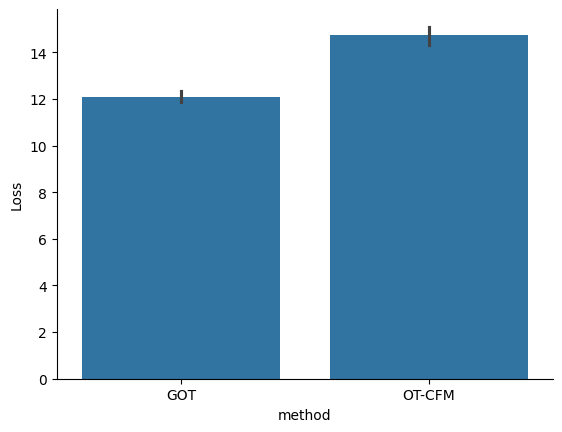

In [37]:
import seaborn as sns
plot_df = pd.concat([got_res, mioflow_res, otcfm_res])
plot_df = plot_df.loc[(plot_df.Loss < 20) & ~(np.isnan(plot_df.Loss))]
sns.barplot(plot_df, x='method', y='Loss')
#plot_df.to_csv('./results/01.2_trajectories/cell19_traj_real.txt', sep='\t')

In [40]:
adata.obsm['X_pumap'], map_model = pygot.pp.learn_embed2vis_map(adata, embedding_key, vis_key='X_umap')

Epoch [25/100], Train Loss: 0.1078, Val Loss: 0.1780:  24%|██████▏                   | 24/100 [01:13<03:54,  3.08s/it]

Early stopping triggered
Test Loss: 0.1304


In [41]:
model = torch.load('./benchmark_model/GOT/01.2_trajectories/cell19/cell19_3.pkl').to('cuda')
mioflow = torch.load('./benchmark_model/MIOFlow/01.2_trajectories/cell19/cell19_0.pkl').to('cuda')
otcfm = torch.load('./benchmark_model/CFM/01.2_trajectories/cell19/cell19_2.pkl').to('cuda')

In [42]:
idx = adata[adata.obs[time_key] == 0].obs.sample(n=100).index

In [43]:
cell_type_key = 'cell_type'

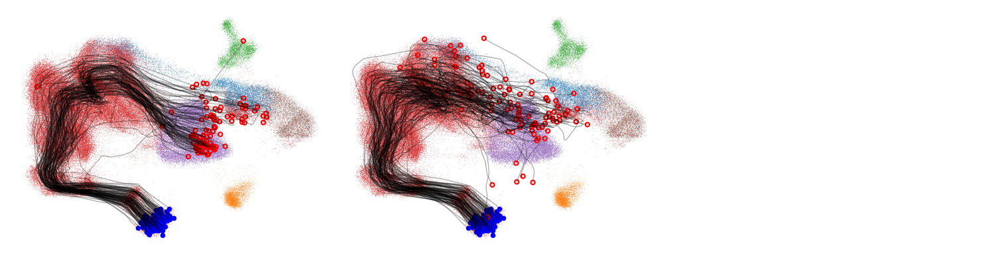

In [44]:
fig, axes = plt.subplots(1,3, figsize=(6.4*3, 4.8))
traj = pygot.tl.traj.simulate_trajectory(adata[idx], model, embedding_key, start=0, end=38)
lowd_traj = map_model.transform(traj)
pygot.pl.plot_trajectory(adata, lowd_traj,  basis='pumap', ax = axes[0], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})

traj = pygot.tl.traj.simulate_trajectory(adata[idx], otcfm, embedding_key, start=0, end=38)
lowd_traj = map_model.transform(traj)
pygot.pl.plot_trajectory(adata, lowd_traj,  basis='pumap', ax = axes[1], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})

#traj = pygot.tl.traj.simulate_trajectory(adata[idx], mioflow.func, embedding_key, start=0, end=38)
#lowd_traj = map_model.transform(traj)
axes[2].axis("off")
#pygot.pl.plot_trajectory(adata, lowd_traj,  basis='pumap', ax = axes[2], embedding_kw={'cmap':'viridis', 'color':cell_type_key, 'legend_loc':None,})

fig.subplots_adjust(wspace=0.01, hspace=0.2)  


# Plot

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

<Axes: xlabel='method', ylabel='Loss'>

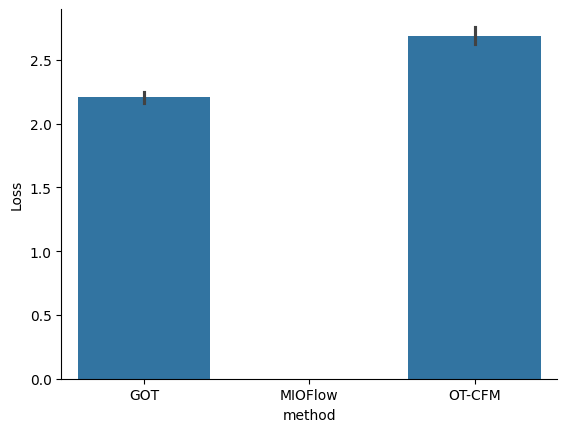

In [46]:
df1 = pd.read_csv('./results/01.2_trajectories/cell19_traj_real.txt', sep='\t',skiprows=0, index_col=0)
df1['dataset'] = 'Schiebinger et al. 2019'
df1["Loss"] /= np.sqrt(30)
sns.barplot(df1.reset_index(drop=True), x='method', y='Loss')

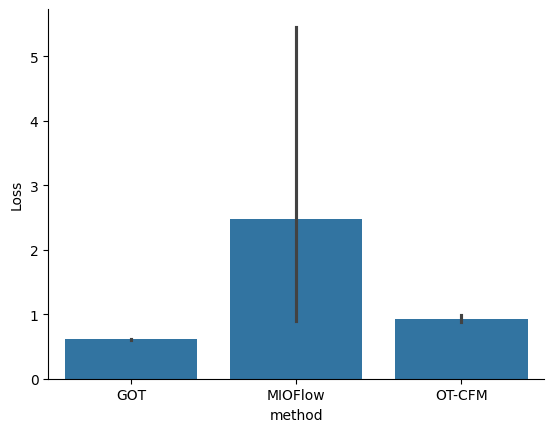

In [47]:
df2 = pd.read_csv('./results/01.2_trajectories/veres19_traj_real.txt', sep='\t',skiprows=0, index_col=0)
df2['dataset'] = 'Veres et al. 2019'
df2["Loss"] /= np.sqrt(10)
sns.barplot(df2.reset_index(drop=True), x='method', y='Loss')
df2 = df2.loc[df2.Loss < 5]

<Axes: xlabel='method', ylabel='Loss'>

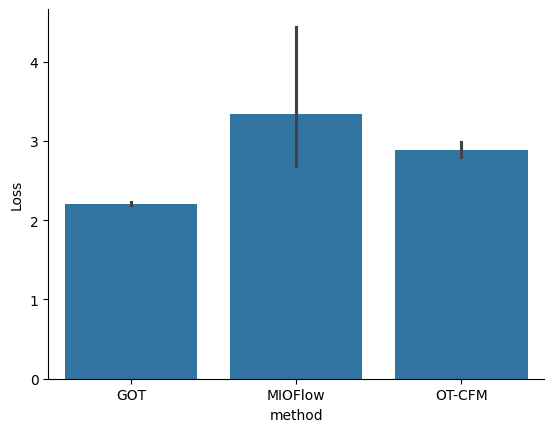

In [49]:
df3 = pd.read_csv('./results/01.2_trajectories//gastrulation_traj_real.txt', sep='\t',index_col=0, )
df3['dataset'] = 'Sala et al. 2019'
df3["Loss"] /= np.sqrt(50)
sns.barplot(df3.reset_index(drop=True), x='method', y='Loss')


In [50]:
import mplscience
mplscience.set_style(reset_current=True)
plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['font.size'] = 16  


In [51]:

plot_df = pd.concat([df2, df3, df1]).reset_index()
plot_df['log_Loss'] = np.log(plot_df['Loss']+1)

In [52]:
plot_df

,index,Loss,method,dataset,log_Loss
0,0,0.615300,GOT,Veres et al. 2019,0.479521
1,1,0.612041,GOT,Veres et al. 2019,0.477501
2,2,0.612524,GOT,Veres et al. 2019,0.477801
3,3,0.595583,GOT,Veres et al. 2019,0.467239
4,4,0.608095,GOT,Veres et al. 2019,0.475050
...,...,...,...,...,...
161,15,2.939469,OT-CFM,Schiebinger et al. 2019,1.371046
162,16,2.792843,OT-CFM,Schiebinger et al. 2019,1.333116
163,17,2.641025,OT-CFM,Schiebinger et al. 2019,1.292265
164,18,2.465983,OT-CFM,Schiebinger et al. 2019,1.242996


In [53]:
plot_df.Loss.max()

13.166467082046031

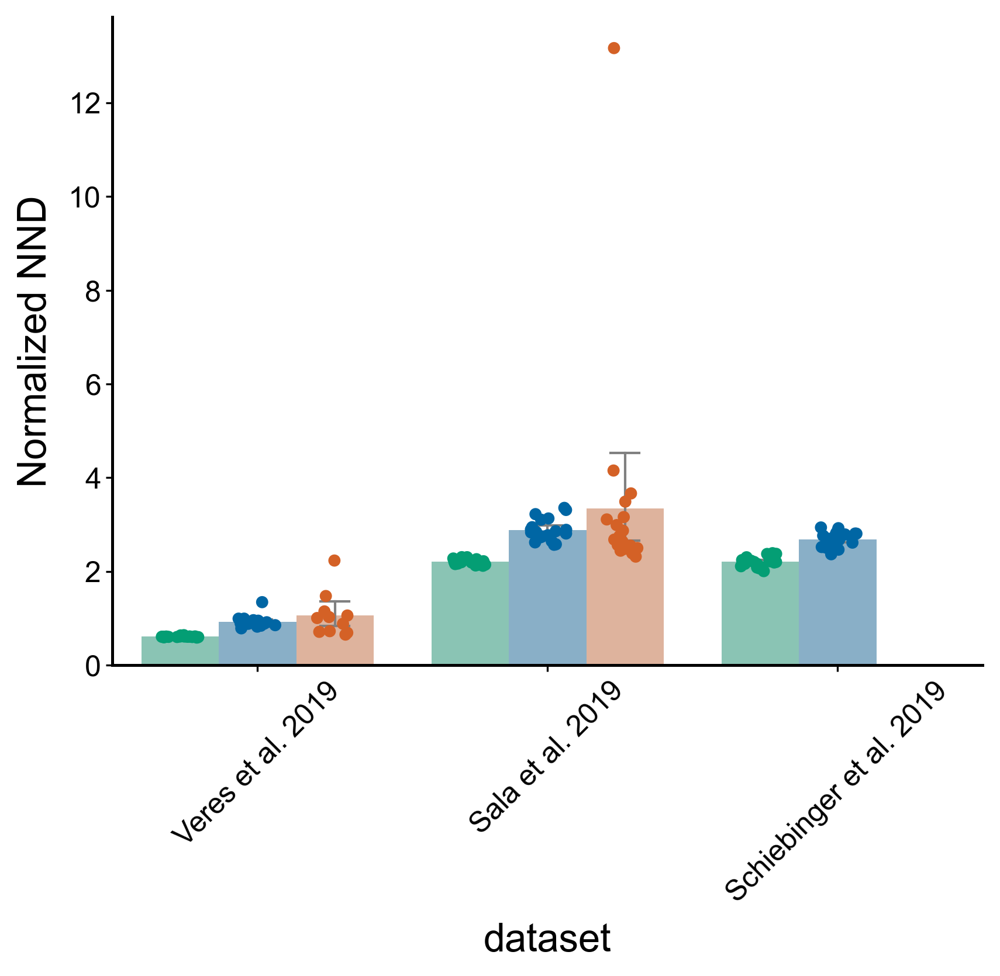

In [54]:
palette = {
    'GOT':'#049e74',
    'OT-CFM':'#0066a4',
    'MIOFlow': '#d46126',
}
fig, ax = plt.subplots(1,1, figsize=(6.4,4.8), dpi=300)


sns.barplot(data=plot_df, 
            x='dataset', y='Loss', hue='method', 
            hue_order=['GOT', 'OT-CFM', 'MIOFlow'], 
            ax=ax, capsize=.3,
            err_kws={"linewidth": 1., 'color':'grey'},
            palette=palette,
            alpha=.5
            
           )


sns.stripplot(
    data=plot_df, 
    x='dataset', y='Loss', hue='method', 
    hue_order=['GOT', 'OT-CFM', 'MIOFlow'], 
    
    dodge=True,  
    jitter=0.2,  
    palette=palette, 
    alpha=1.,
    legend=False,
    #ax=ax,
    size=5,
    
)

plt.xticks(rotation=45)
ax.get_legend().remove()
plt.ylabel('Normalized NND')

plt.show()


In [55]:
plot_df.loc[plot_df.Loss != plot_df.Loss.max()]

,index,Loss,method,dataset,log_Loss
0,0,0.615300,GOT,Veres et al. 2019,0.479521
1,1,0.612041,GOT,Veres et al. 2019,0.477501
2,2,0.612524,GOT,Veres et al. 2019,0.477801
3,3,0.595583,GOT,Veres et al. 2019,0.467239
4,4,0.608095,GOT,Veres et al. 2019,0.475050
...,...,...,...,...,...
161,15,2.939469,OT-CFM,Schiebinger et al. 2019,1.371046
162,16,2.792843,OT-CFM,Schiebinger et al. 2019,1.333116
163,17,2.641025,OT-CFM,Schiebinger et al. 2019,1.292265
164,18,2.465983,OT-CFM,Schiebinger et al. 2019,1.242996


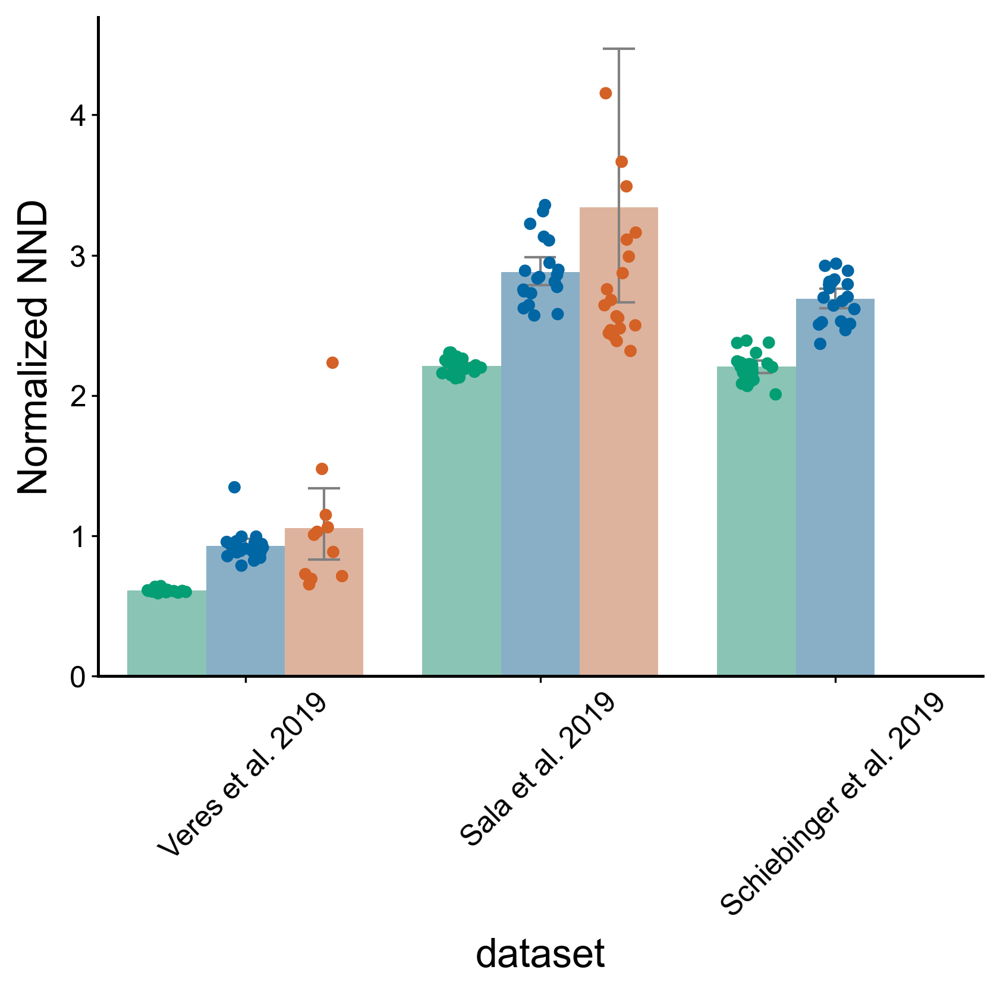

In [56]:
palette = {
    'GOT':'#049e74',
    'OT-CFM':'#0066a4',
    'MIOFlow': '#d46126',
}
fig, ax = plt.subplots(1,1, figsize=(6.4,4.8), dpi=300)


sns.barplot(data=plot_df, 
            x='dataset', y='Loss', hue='method', 
            hue_order=['GOT', 'OT-CFM', 'MIOFlow'], 
            ax=ax, capsize=.3,
            err_kws={"linewidth": 1., 'color':'grey'},
            palette=palette,
            alpha=.5
            
           )

# 再叠加抖动点图
sns.stripplot(
    data=plot_df.loc[plot_df.Loss != plot_df.Loss.max()], 
    x='dataset', y='Loss', hue='method', 
    hue_order=['GOT', 'OT-CFM', 'MIOFlow'], 
    
    dodge=True,  
    jitter=0.2,  
    palette=palette, 
    alpha=1.,
    legend=False,
    #ax=ax,
    size=5,
    
)

plt.xticks(rotation=45)
ax.get_legend().remove()
plt.ylabel('Normalized NND')

plt.show()
